In [1]:

from google.colab import drive
drive.mount('/content/drive')

!unzip '/content/drive/MyDrive/RM_Segmentation_Assignment_dataset.zip'

# Install required packages
!pip install torchmetrics
!pip install pycocotools

print("Setup completed successfully!")

Mounted at /content/drive
Archive:  /content/drive/MyDrive/RM_Segmentation_Assignment_dataset.zip
  inflating: test-30/000000001751.jpg  
  inflating: test-30/000000001380.jpg  
  inflating: test-30/000000001643.jpg  
  inflating: test-30/000000001583.jpg  
  inflating: test-30/000000001685.jpg  
  inflating: test-30/000000001482.jpg  
  inflating: test-30/000000001494.jpg  
  inflating: test-30/000000001551.jpg  
  inflating: test-30/000000001654.jpg  
  inflating: test-30/000000001594.jpg  
  inflating: test-30/000000001411.jpg  
  inflating: test-30/000000001459.jpg  
  inflating: test-30/000000001410.jpg  
  inflating: test-30/000000001717.jpg  
  inflating: test-30/000000001730.jpg  
  inflating: validation-300/labels.json  
  inflating: test-30/000000001385.jpg  
  inflating: train-300/labels.json   
  inflating: test-30/000000001492.jpg  
  inflating: test-30/000000001600.jpg  
  inflating: test-30/000000001657.jpg  
  inflating: test-30/000000001671.jpg  
  inflating: test-30/0

##Imports

In [2]:

import os
import random
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import seaborn as sns

import torchvision
import torchvision.transforms as transforms
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from pycocotools.coco import COCO
from pycocotools import mask as coco_mask

from torchmetrics.detection import MeanAveragePrecision
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


#Dataset paths

In [3]:

train_img_dir = "train-300/data"
train_labels_file = "train-300/labels.json"
val_img_dir = "validation-300/data"
val_labels_file = "validation-300/labels.json"
test_img_dir = "test-30"

# Define target classes (background = 0 is implicit in Mask R-CNN)
TARGET_CLASSES = {
    'cake': 1,
    'car': 2,
    'dog': 3,
    'person': 4
}

# Will store mapping from COCO category IDs to our target class IDs
COCO_TO_TARGET = {}

print("Dataset configuration completed!")
print(f"Target classes: {list(TARGET_CLASSES.keys())}")

Dataset configuration completed!
Target classes: ['cake', 'car', 'dog', 'person']


# Exploratory Data Analysis

In [4]:


# Load COCO dataset for analysis
coco_data = COCO(train_labels_file)
print(f"Dataset loaded: {len(coco_data.getImgIds())} images, {len(coco_data.getAnnIds())} annotations")



# Get all categories and create mapping
all_categories = coco_data.loadCats(coco_data.getCatIds())
target_category_names = list(TARGET_CLASSES.keys())

# Find COCO IDs for our target classes
target_coco_cats = coco_data.loadCats(coco_data.getCatIds(catNms=target_category_names))

# Create mapping dictionary
for cat in target_coco_cats:
    COCO_TO_TARGET[cat['id']] = TARGET_CLASSES[cat['name']]

print("COCO ID to Target Class Mapping:")
for coco_id, target_id in COCO_TO_TARGET.items():
    cat_name = coco_data.loadCats([coco_id])[0]['name']
    print(f"  COCO ID {coco_id} ({cat_name}) → Target Class {target_id}")

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
Dataset loaded: 300 images, 3870 annotations
COCO ID to Target Class Mapping:
  COCO ID 15 (cake) → Target Class 1
  COCO ID 16 (car) → Target Class 2
  COCO ID 25 (dog) → Target Class 3
  COCO ID 41 (person) → Target Class 4


## Class Distribution Analysis


Annotation Statistics:
  cake: 13 annotations (0.5%)
  car: 1061 annotations (43.5%)
  dog: 14 annotations (0.6%)
  person: 1350 annotations (55.4%)


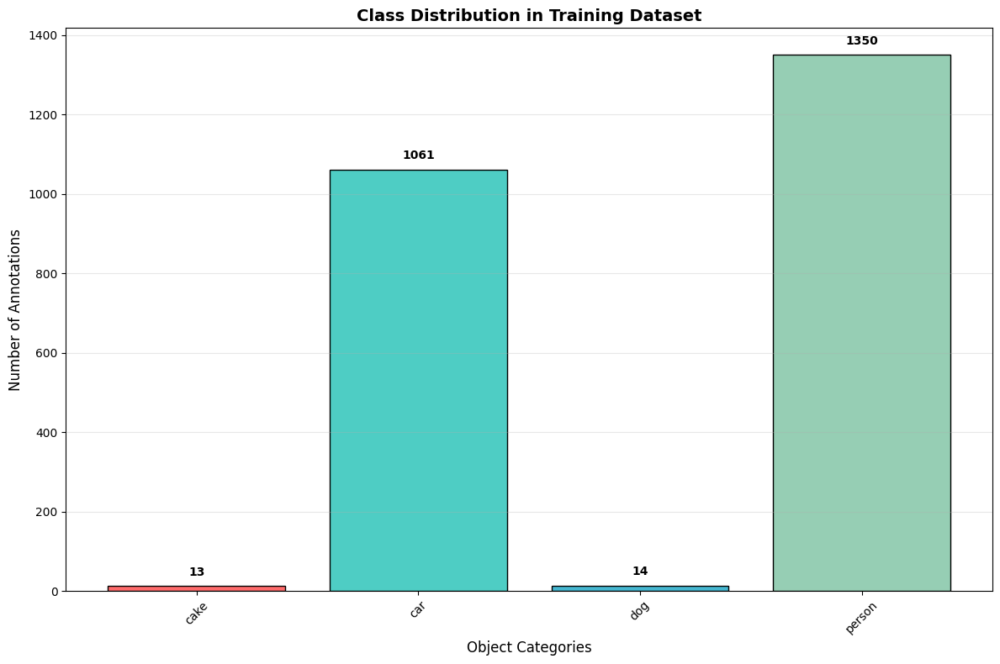

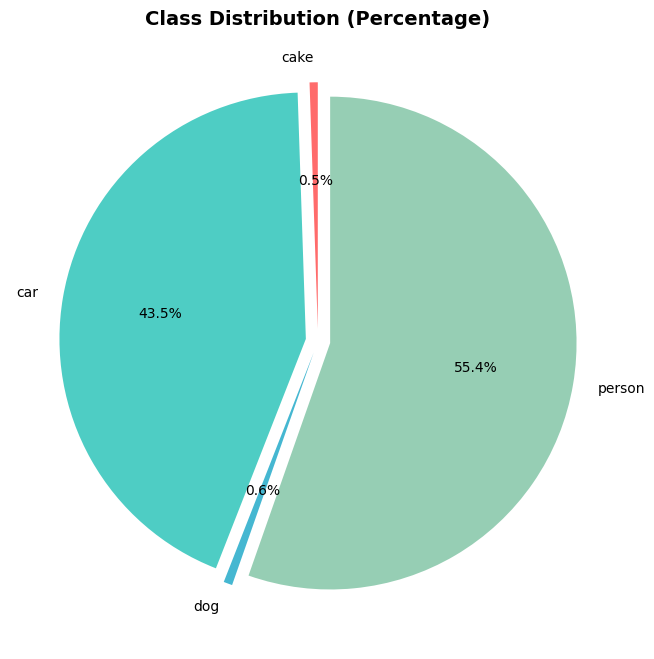


Class Imbalance Analysis:
  Most frequent class: 1350 annotations
  Least frequent class: 13 annotations
  Imbalance ratio: 103.8:1
  ⚠️  SEVERE CLASS IMBALANCE DETECTED!


In [5]:
## Class Distribution Analysis

# Count annotations per class
annotation_counts = []
for cat_name in target_category_names:
    cat_ids = coco_data.getCatIds(catNms=[cat_name])
    count = len(coco_data.getAnnIds(catIds=cat_ids))
    annotation_counts.append(count)

print("\nAnnotation Statistics:")
total_annotations = sum(annotation_counts)
for name, count in zip(target_category_names, annotation_counts):
    percentage = (count / total_annotations) * 100
    print(f"  {name}: {count} annotations ({percentage:.1f}%)")

# Visualize class distribution
plt.figure(figsize=(12, 8))
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4']
bars = plt.bar(target_category_names, annotation_counts, color=colors, edgecolor='black')

plt.xlabel('Object Categories', fontsize=12)
plt.ylabel('Number of Annotations', fontsize=12)
plt.title('Class Distribution in Training Dataset', fontsize=14, fontweight='bold')

# Add value labels on bars
for bar, count in zip(bars, annotation_counts):
    plt.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 20,
             str(count), ha='center', va='bottom', fontweight='bold')

plt.xticks(rotation=45)
plt.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

# Create pie chart for better imbalance visualization
plt.figure(figsize=(10, 8))
plt.pie(annotation_counts, labels=target_category_names, autopct='%1.1f%%',
        startangle=90, colors=colors, explode=(0.05, 0.05, 0.05, 0.05))
plt.title('Class Distribution (Percentage)', fontsize=14, fontweight='bold')
plt.show()

# Analyze class imbalance
max_count = max(annotation_counts)
min_count = min(annotation_counts)
imbalance_ratio = max_count / min_count

print(f"\nClass Imbalance Analysis:")
print(f"  Most frequent class: {max_count} annotations")
print(f"  Least frequent class: {min_count} annotations")
print(f"  Imbalance ratio: {imbalance_ratio:.1f}:1")
if imbalance_ratio > 10:
    print(" SEVERE CLASS IMBALANCE DETECTED!")

## Image and Object Size Analysis

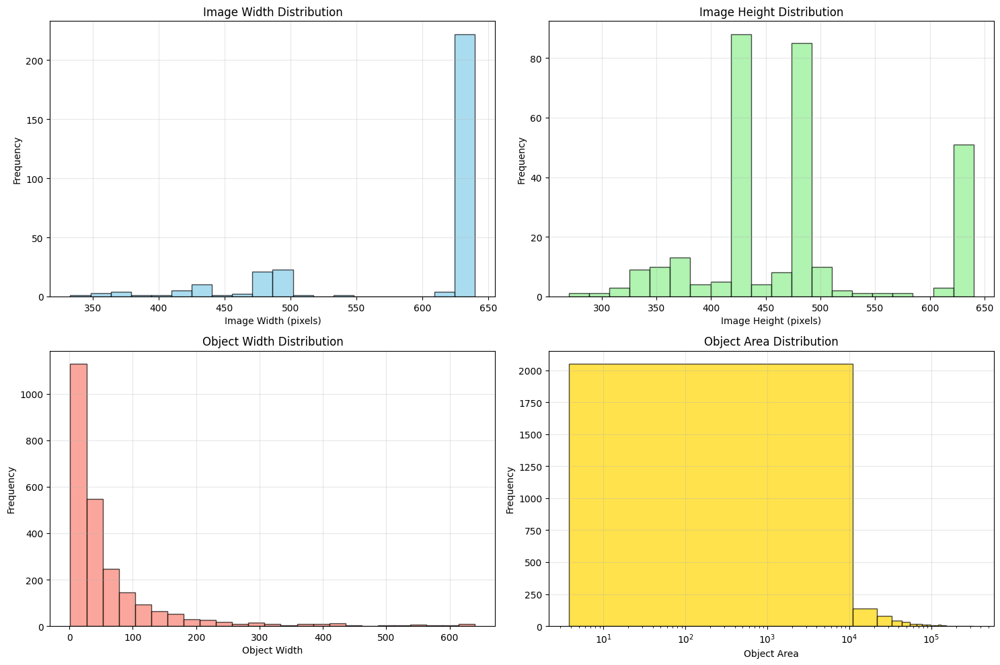

Size Statistics:
  Image Width  - Mean: 595, Range: [333, 640]
  Image Height - Mean: 475, Range: [270, 640]
  Object Width - Mean: 60.3, Range: [1.4, 640.0]
  Object Area  - Mean: 8974, Median: 1050


In [6]:


# Get image metadata
img_info = coco_data.loadImgs(coco_data.getImgIds())
img_widths = [img['width'] for img in img_info]
img_heights = [img['height'] for img in img_info]

# Get object information for target classes
all_annotations = coco_data.loadAnns(coco_data.getAnnIds())
target_annotations = [ann for ann in all_annotations if ann['category_id'] in COCO_TO_TARGET]

bbox_widths = [ann['bbox'][2] for ann in target_annotations]
bbox_heights = [ann['bbox'][3] for ann in target_annotations]
bbox_areas = [w * h for w, h in zip(bbox_widths, bbox_heights)]

# Create size analysis plots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))

# Image dimensions
ax1.hist(img_widths, bins=20, alpha=0.7, color='skyblue', edgecolor='black')
ax1.set_xlabel('Image Width (pixels)')
ax1.set_ylabel('Frequency')
ax1.set_title('Image Width Distribution')
ax1.grid(True, alpha=0.3)

ax2.hist(img_heights, bins=20, alpha=0.7, color='lightgreen', edgecolor='black')
ax2.set_xlabel('Image Height (pixels)')
ax2.set_ylabel('Frequency')
ax2.set_title('Image Height Distribution')
ax2.grid(True, alpha=0.3)

# Object dimensions
ax3.hist(bbox_widths, bins=25, alpha=0.7, color='salmon', edgecolor='black')
ax3.set_xlabel('Object Width')
ax3.set_ylabel('Frequency')
ax3.set_title('Object Width Distribution')
ax3.grid(True, alpha=0.3)

ax4.hist(bbox_areas, bins=30, alpha=0.7, color='gold', edgecolor='black')
ax4.set_xlabel('Object Area')
ax4.set_ylabel('Frequency')
ax4.set_title('Object Area Distribution')
ax4.set_xscale('log')
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"Size Statistics:")
print(f"  Image Width  - Mean: {np.mean(img_widths):.0f}, Range: [{min(img_widths)}, {max(img_widths)}]")
print(f"  Image Height - Mean: {np.mean(img_heights):.0f}, Range: [{min(img_heights)}, {max(img_heights)}]")
print(f"  Object Width - Mean: {np.mean(bbox_widths):.1f}, Range: [{min(bbox_widths):.1f}, {max(bbox_widths):.1f}]")
print(f"  Object Area  - Mean: {np.mean(bbox_areas):.0f}, Median: {np.median(bbox_areas):.0f}")

# Sample Data Visualization


--- CAKE SAMPLES ---


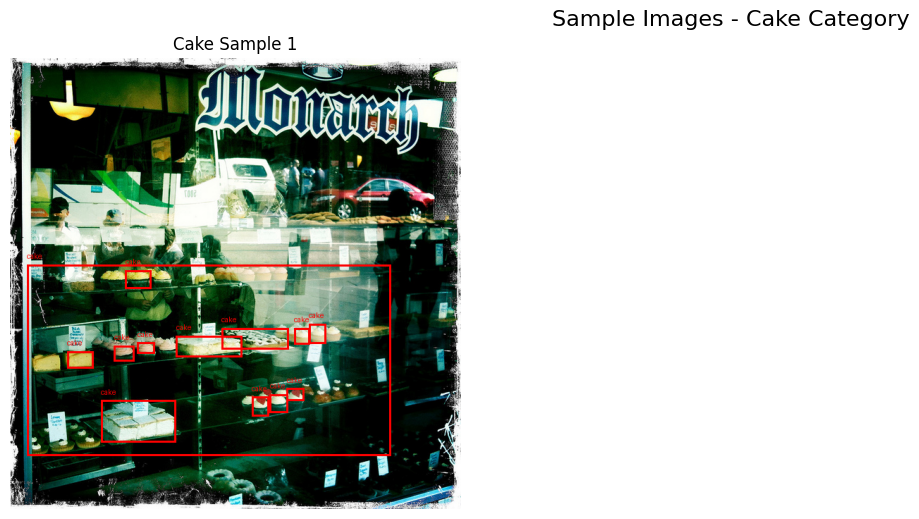


--- CAR SAMPLES ---


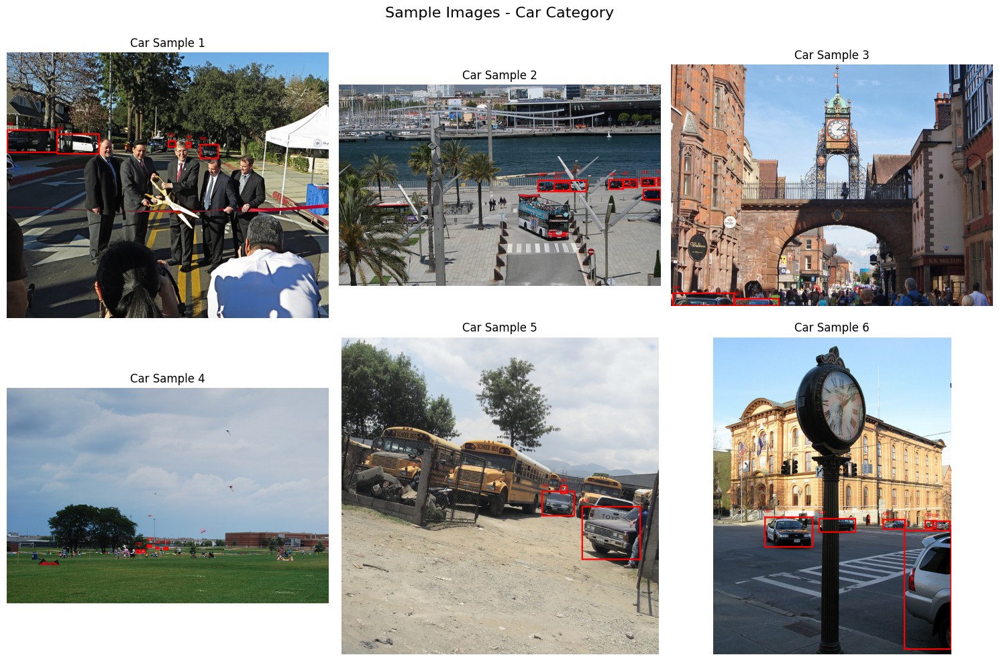


--- DOG SAMPLES ---


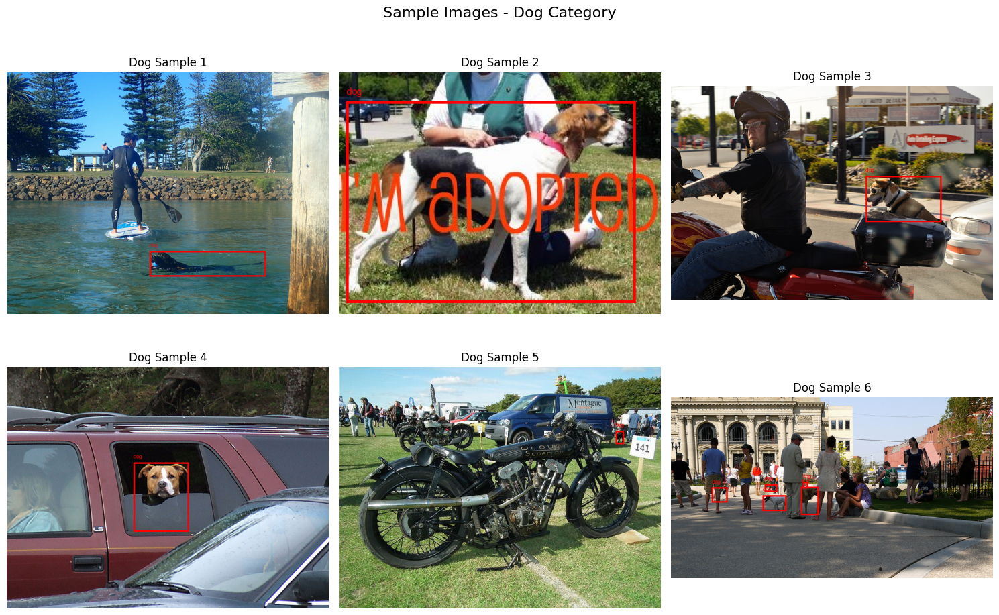


--- PERSON SAMPLES ---


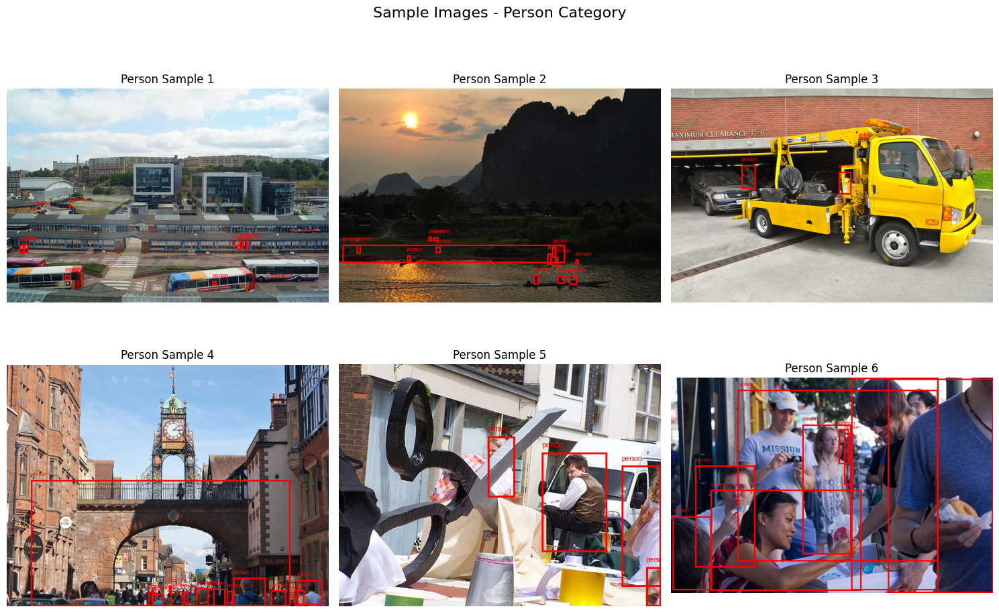

In [7]:


def visualize_category_samples(category_name, num_samples=6):

    cat_ids = coco_data.getCatIds(catNms=[category_name])
    img_ids = coco_data.getImgIds(catIds=cat_ids)

    if len(img_ids) == 0:
        print(f"No images found for category: {category_name}")
        return

    # Select random samples
    sample_ids = random.sample(img_ids, min(num_samples, len(img_ids)))

    plt.figure(figsize=(15, 10))

    for i, img_id in enumerate(sample_ids):
        img_info = coco_data.loadImgs(img_id)[0]
        img_path = os.path.join(train_img_dir, img_info['file_name'])

        if not os.path.exists(img_path):
            continue

        img = Image.open(img_path).convert('RGB')

        # Get annotations for this category
        ann_ids = coco_data.getAnnIds(imgIds=img_id, catIds=cat_ids)
        annotations = coco_data.loadAnns(ann_ids)

        # Draw bounding boxes
        draw = ImageDraw.Draw(img)
        for ann in annotations:
            bbox = ann['bbox']
            x, y, w, h = bbox
            draw.rectangle([x, y, x + w, y + h], outline='red', width=3)

            # Add label
            try:
                font = ImageFont.truetype("arial.ttf", 14)
            except:
                font = ImageFont.load_default()
            draw.text((x, y - 18), category_name, fill='red', font=font)

        plt.subplot(2, 3, i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'{category_name.title()} Sample {i+1}')

    plt.suptitle(f'Sample Images - {category_name.title()} Category', fontsize=16)
    plt.tight_layout()
    plt.show()

# Visualize samples for each category
for category in target_category_names:
    print(f"\n--- {category.upper()} SAMPLES ---")
    visualize_category_samples(category, 6)

## Multi-class Scene Examples"""


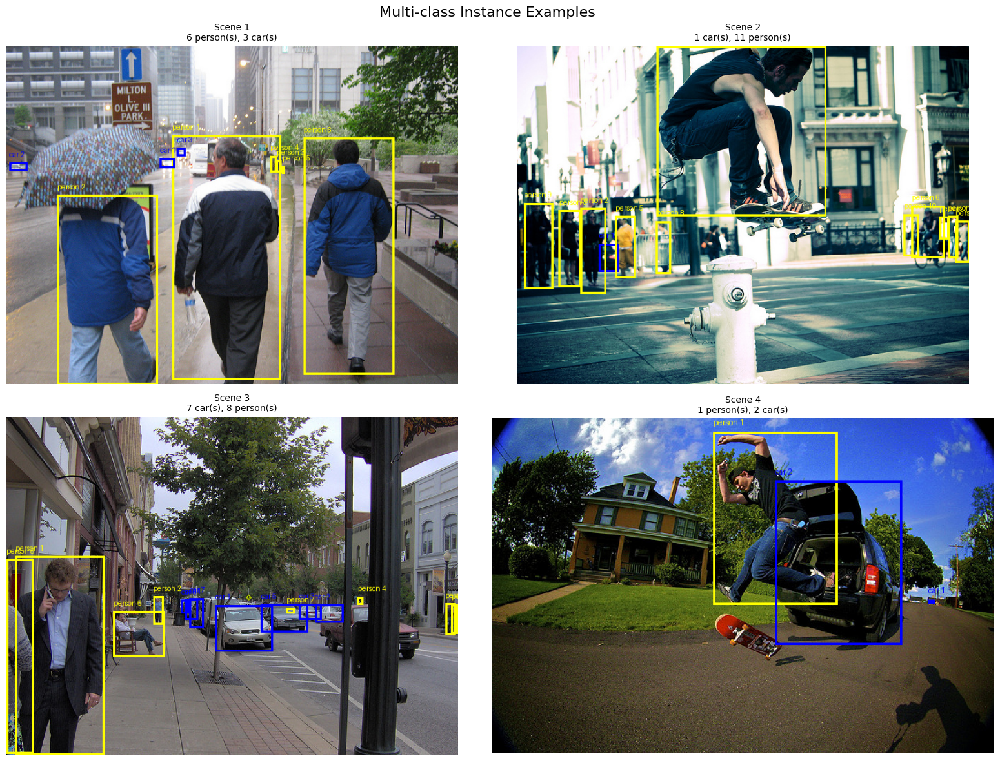

In [8]:


def show_complex_scenes(num_samples=4):


    class_colors = {
        'cake': 'red', 'car': 'blue', 'dog': 'green', 'person': 'yellow'
    }

    plt.figure(figsize=(16, 12))

    samples_found = 0
    attempts = 0

    while samples_found < num_samples and attempts < 100:
        # Get random image
        img_id = random.choice(coco_data.getImgIds())

        # Check for target class annotations
        ann_ids = coco_data.getAnnIds(imgIds=img_id, catIds=list(COCO_TO_TARGET.keys()))

        if len(ann_ids) == 0:
            attempts += 1
            continue

        img_info = coco_data.loadImgs(img_id)[0]
        img_path = os.path.join(train_img_dir, img_info['file_name'])

        if not os.path.exists(img_path):
            attempts += 1
            continue

        img = Image.open(img_path).convert('RGB')
        annotations = coco_data.loadAnns(ann_ids)

        # Draw annotations
        draw = ImageDraw.Draw(img)
        class_counts = {}

        for ann in annotations:
            cat_id = ann['category_id']
            if cat_id in COCO_TO_TARGET:
                cat_name = coco_data.loadCats([cat_id])[0]['name']

                # Count instances
                if cat_name not in class_counts:
                    class_counts[cat_name] = 0
                class_counts[cat_name] += 1

                # Draw bounding box
                bbox = ann['bbox']
                x, y, w, h = bbox
                color = class_colors.get(cat_name, 'white')
                draw.rectangle([x, y, x + w, y + h], outline=color, width=3)

                # Add label
                try:
                    font = ImageFont.truetype("arial.ttf", 12)
                except:
                    font = ImageFont.load_default()
                label = f'{cat_name} {class_counts[cat_name]}'
                draw.text((x, y - 18), label, fill=color, font=font)

        # Create title
        title_parts = [f'{count} {name}(s)' for name, count in class_counts.items()]
        title = ', '.join(title_parts)

        plt.subplot(2, 2, samples_found + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Scene {samples_found + 1}\n{title}', fontsize=10)

        samples_found += 1
        attempts += 1

    plt.suptitle('Multi-class Instance Examples', fontsize=16)
    plt.tight_layout()
    plt.show()

show_complex_scenes(4)

# Custom Dataset Implementation for Mask R-CNN

In [9]:


class MaskRCNNDataset(Dataset):
    """Custom dataset class for Mask R-CNN training"""

    def __init__(self, coco_dataset, img_dir, transforms=None):
        self.coco = coco_dataset
        self.img_dir = img_dir
        self.transforms = transforms

        # Get images that contain our target classes
        self.img_ids = []
        for img_id in self.coco.getImgIds():
            ann_ids = self.coco.getAnnIds(imgIds=img_id, catIds=list(COCO_TO_TARGET.keys()))
            if len(ann_ids) > 0:
                self.img_ids.append(img_id)

        print(f"Dataset created with {len(self.img_ids)} images containing target classes")

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]

        # Load image
        img_info = self.coco.loadImgs(img_id)[0]
        img_path = os.path.join(self.img_dir, img_info['file_name'])
        img = Image.open(img_path).convert('RGB')

        # Get annotations for target classes
        ann_ids = self.coco.getAnnIds(imgIds=img_id, catIds=list(COCO_TO_TARGET.keys()))
        annotations = self.coco.loadAnns(ann_ids)

        # Prepare targets
        boxes = []
        labels = []
        masks = []
        areas = []
        iscrowd = []

        for ann in annotations:
            # Skip if no segmentation data
            if 'segmentation' not in ann or not ann['segmentation']:
                continue

            # Convert COCO category ID to target class ID
            coco_cat_id = ann['category_id']
            if coco_cat_id not in COCO_TO_TARGET:
                continue

            target_label = COCO_TO_TARGET[coco_cat_id]

            # Get bounding box (COCO format: [x, y, width, height])
            bbox = ann['bbox']
            x, y, w, h = bbox
            boxes.append([x, y, x + w, y + h])  # Convert to [x1, y1, x2, y2]
            labels.append(target_label)

            # Get segmentation mask
            try:
                mask = self.coco.annToMask(ann)
                masks.append(mask)
            except:
                continue  # Skip if mask conversion fails

            areas.append(ann['area'])
            iscrowd.append(ann.get('iscrowd', 0))

        # Convert to tensors
        if len(boxes) == 0:
            # Handle images with no valid annotations
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
            masks = torch.zeros((0, img_info['height'], img_info['width']), dtype=torch.uint8)
            areas = torch.zeros((0,), dtype=torch.float32)
            iscrowd = torch.zeros((0,), dtype=torch.int64)
        else:
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)
            masks = torch.as_tensor(np.array(masks), dtype=torch.uint8)
            areas = torch.as_tensor(areas, dtype=torch.float32)
            iscrowd = torch.as_tensor(iscrowd, dtype=torch.int64)

        target = {
            'boxes': boxes,
            'labels': labels,
            'masks': masks,
            'image_id': torch.tensor([img_id]),
            'area': areas,
            'iscrowd': iscrowd
        }

        # Apply transforms
        if self.transforms:
            img = self.transforms(img)
        else:
            img = transforms.ToTensor()(img)

        return img, target

def get_transforms(train=True):
    """Get image transforms for training/validation"""
    transform_list = [transforms.ToTensor()]
    if train:
        # Add data augmentation for training
        transform_list.extend([
            transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
        ])
    return transforms.Compose(transform_list)

# Create datasets
train_coco = COCO(train_labels_file)
val_coco = COCO(val_labels_file)

train_dataset = MaskRCNNDataset(train_coco, train_img_dir, get_transforms(train=True))
val_dataset = MaskRCNNDataset(val_coco, val_img_dir, get_transforms(train=False))

print(f"Training dataset: {len(train_dataset)} images")
print(f"Validation dataset: {len(val_dataset)} images")

loading annotations into memory...
Done (t=0.28s)
creating index...
index created!
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
Dataset created with 300 images containing target classes
Dataset created with 300 images containing target classes
Training dataset: 300 images
Validation dataset: 300 images


# Class Imbalance Analysis and Handling

In [10]:


# Calculate class distribution in training data
from collections import Counter

class_counts_in_data = Counter()
for i in range(len(train_dataset)):
    _, target = train_dataset[i]
    labels = target['labels'].tolist()
    class_counts_in_data.update(labels)

print("Class distribution in training data:")
for class_id, count in sorted(class_counts_in_data.items()):
    class_name = list(TARGET_CLASSES.keys())[list(TARGET_CLASSES.values()).index(class_id)]
    print(f"  Class {class_id} ({class_name}): {count} instances")

# Calculate balanced class weights using inverse frequency
total_instances = sum(class_counts_in_data.values())
class_weights = []

for class_id in range(1, len(TARGET_CLASSES) + 1):
    count = class_counts_in_data.get(class_id, 1)  # Avoid division by zero
    weight = total_instances / (len(TARGET_CLASSES) * count)
    class_weights.append(weight)

class_weights = np.array(class_weights)

# Apply smoothing to prevent extreme weights
class_weights = np.clip(class_weights, 0.1, 10.0)  # Cap weights between 0.1 and 10
class_weights = class_weights / class_weights.sum() * len(class_weights)  # Normalize

print(f"\nCalculated class weights:")
for i, weight in enumerate(class_weights):
    class_name = list(TARGET_CLASSES.keys())[i]
    print(f"  {class_name}: {weight:.3f}")

# Convert to tensor
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float32).to(device)

Class distribution in training data:
  Class 1 (cake): 13 instances
  Class 2 (car): 1061 instances
  Class 3 (dog): 14 instances
  Class 4 (person): 1350 instances

Calculated class weights:
  cake: 1.902
  car: 0.109
  dog: 1.902
  person: 0.086


## Data Loader Setup

Dataset Verification - Training Samples:

--- Sample 0 ---


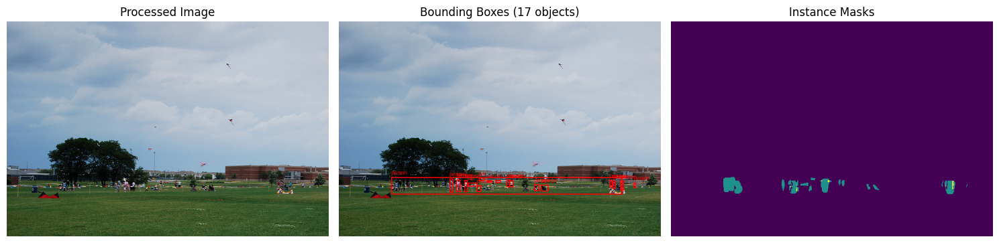

Image ID: 1
Number of objects: 17
Classes present: ['person', 'person', 'person', 'person', 'person', 'person', 'car', 'car', 'car', 'car', 'person', 'person', 'person', 'person', 'person', 'person', 'person']
Object areas: [128.10130310058594, 89.99040222167969, 87.88500213623047, 190.51199340820312, 131.42100524902344, 74.92479705810547, 51.70100021362305, 49.617698669433594, 35.604000091552734, 140.2344970703125, 102.81639862060547, 72.4905014038086, 44.65760040283203, 122.51959991455078, 190.11239624023438, 207.8843994140625, 15606.0]

--- Sample 10 ---


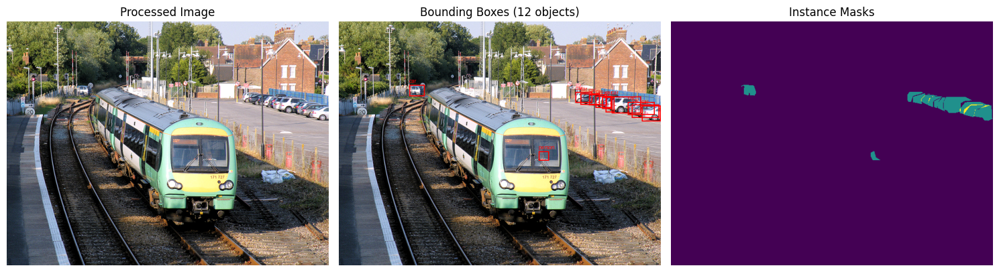

Image ID: 11
Number of objects: 12
Classes present: ['car', 'car', 'car', 'car', 'car', 'car', 'car', 'car', 'car', 'car', 'car', 'person']
Object areas: [1882.7955322265625, 1130.9100341796875, 745.2620849609375, 863.4758911132812, 1410.0865478515625, 1319.3045654296875, 529.2525024414062, 642.9338989257812, 416.8023986816406, 685.6666259765625, 762.6500244140625, 351.8240051269531]

--- Sample 20 ---


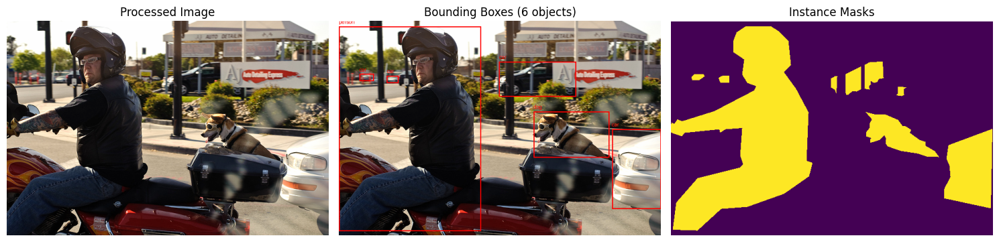

Image ID: 21
Number of objects: 6
Classes present: ['dog', 'car', 'car', 'person', 'car', 'car']
Object areas: [13679.7529296875, 10621.5400390625, 15332.322265625, 114623.3359375, 330.16900634765625, 394.3255920410156]

Data loaders created successfully!
Training batches: 75
Validation batches: 75


In [11]:


def collate_fn(batch):
    """Custom collate function for Mask R-CNN"""
    return tuple(zip(*batch))

def visualize_dataset_sample(dataset, idx):
    """Visualize a sample from the processed dataset"""
    img, target = dataset[idx]

    # Convert tensor back to PIL for visualization
    img_pil = transforms.ToPILImage()(img)
    img_array = np.array(img_pil)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Original image
    axes[0].imshow(img_array)
    axes[0].set_title('Processed Image')
    axes[0].axis('off')

    # Image with bounding boxes
    img_with_boxes = img_pil.copy()
    draw = ImageDraw.Draw(img_with_boxes)

    for box, label in zip(target['boxes'], target['labels']):
        x1, y1, x2, y2 = box.tolist()
        class_name = list(TARGET_CLASSES.keys())[list(TARGET_CLASSES.values()).index(label.item())]

        draw.rectangle([x1, y1, x2, y2], outline='red', width=2)
        draw.text((x1, y1 - 15), f'{class_name}', fill='red')

    axes[1].imshow(img_with_boxes)
    axes[1].set_title(f'Bounding Boxes ({len(target["boxes"])} objects)')
    axes[1].axis('off')

    # Show combined masks
    if len(target['masks']) > 0:
        combined_mask = torch.sum(target['masks'], dim=0).numpy()
        axes[2].imshow(combined_mask, cmap='viridis')
        axes[2].set_title('Instance Masks')
        axes[2].axis('off')
    else:
        axes[2].text(0.5, 0.5, 'No masks', ha='center', va='center', transform=axes[2].transAxes)
        axes[2].set_title('No Masks Available')
        axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    # Print sample information
    print(f"Image ID: {target['image_id'].item()}")
    print(f"Number of objects: {len(target['boxes'])}")
    if len(target['labels']) > 0:
        class_names = [list(TARGET_CLASSES.keys())[list(TARGET_CLASSES.values()).index(l.item())] for l in target['labels']]
        print(f"Classes present: {class_names}")
    print(f"Object areas: {target['area'].tolist()}")

# Verify dataset samples
print("Dataset Verification - Training Samples:")
for i in [0, 10, 20]:
    print(f"\n--- Sample {i} ---")
    visualize_dataset_sample(train_dataset, i)

# Create data loaders
train_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True,
    collate_fn=collate_fn,
    num_workers=2
)

val_loader = DataLoader(
    val_dataset,
    batch_size=4,
    shuffle=False,
    collate_fn=collate_fn,
    num_workers=2
)

print(f"\nData loaders created successfully!")
print(f"Training batches: {len(train_loader)}")
print(f"Validation batches: {len(val_loader)}")

# Mask R-CNN Model Setup

In [12]:


def get_maskrcnn_model(num_classes):

    try:

        from torchvision.models.detection import MaskRCNN_ResNet50_FPN_Weights
        weights = MaskRCNN_ResNet50_FPN_Weights.DEFAULT
        model = maskrcnn_resnet50_fpn(weights=weights)
    except:
        # Fallback for older versions
        model = maskrcnn_resnet50_fpn(pretrained=True)

    # Replace the classifier head
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # Replace the mask predictor
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    model.roi_heads.mask_predictor = MaskRCNNPredictor(
        in_features_mask, hidden_layer, num_classes
    )

    return model

# Create model (4 target classes + 1 background)
num_classes = len(TARGET_CLASSES) + 1
model = get_maskrcnn_model(num_classes)
model.to(device)

# Model information
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Model Configuration:")
print(f"  Architecture: Mask R-CNN with ResNet-50 FPN backbone")
print(f"  Total parameters: {total_params:,}")
print(f"  Trainable parameters: {trainable_params:,}")
print(f"  Number of classes: {num_classes} (including background)")
print(f"  Target classes: {list(TARGET_CLASSES.keys())}")

Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:00<00:00, 215MB/s]


Model Configuration:
  Architecture: Mask R-CNN with ResNet-50 FPN backbone
  Total parameters: 43,938,541
  Trainable parameters: 43,716,141
  Number of classes: 5 (including background)
  Target classes: ['cake', 'car', 'dog', 'person']


## Training Configuration and Optimizer Setup

In [13]:


# Optimizer configuration
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(
    params,
    lr=0.002,  # Reduced learning rate for stability
    momentum=0.9,
    weight_decay=0.0005
)

# Learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=4,  # Reduce LR every 4 epochs
    gamma=0.1
)

# Training parameters
num_epochs = 12
print_freq = 10

print(f"Training Configuration:")
print(f"  Epochs: {num_epochs}")
print(f"  Learning rate: {optimizer.param_groups[0]['lr']}")
print(f"  Optimizer: SGD with momentum={optimizer.param_groups[0]['momentum']}")
print(f"  Weight decay: {optimizer.param_groups[0]['weight_decay']}")
print(f"  LR scheduler: StepLR (step_size=4, gamma=0.1)")

Training Configuration:
  Epochs: 12
  Learning rate: 0.002
  Optimizer: SGD with momentum=0.9
  Weight decay: 0.0005
  LR scheduler: StepLR (step_size=4, gamma=0.1)


#Training loop

In [14]:

def train_one_epoch(model, optimizer, data_loader, device, epoch):

    model.train()

    total_loss = 0
    loss_components = {
        'loss_classifier': 0,
        'loss_box_reg': 0,
        'loss_mask': 0,
        'loss_objectness': 0,
        'loss_rpn_box_reg': 0
    }

    progress_bar = tqdm(data_loader, desc=f"Epoch {epoch}")

    for batch_idx, (images, targets) in enumerate(progress_bar):
        # Move data to device
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Forward pass
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        # Backward pass
        optimizer.zero_grad()
        losses.backward()

        # Gradient clipping for stability
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()

        # Track losses
        total_loss += losses.item()
        for key in loss_components:
            if key in loss_dict:
                loss_components[key] += loss_dict[key].item()

        # Update progress bar
        progress_bar.set_postfix({
            'Total': f'{losses.item():.3f}',
            'Cls': f'{loss_dict.get("loss_classifier", 0):.3f}',
            'Box': f'{loss_dict.get("loss_box_reg", 0):.3f}',
            'Mask': f'{loss_dict.get("loss_mask", 0):.3f}'
        })

    # Calculate averages
    num_batches = len(data_loader)
    avg_losses = {
        'total_loss': total_loss / num_batches,
        **{k: v / num_batches for k, v in loss_components.items()}
    }

    return avg_losses

def evaluate_model(model, data_loader, device):
    """Evaluate the model on validation set"""
    model.eval()


    predictions = []
    targets_list = []

    with torch.no_grad(): # Essential to avoid gradient calculations and reduce memory usage
        progress_bar = tqdm(data_loader, desc="Evaluating")

        for images, targets in progress_bar:
           images = [img.to(device) for img in images]
           targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

           outputs = model(images)

           # Move outputs to CPU to free up GPU memory as soon as possible
           # And detach tensors to avoid memory leaks if they retain graph
           predictions.extend([{k: v.cpu().detach() for k, v in out.items()} for out in outputs])
           targets_list.extend([{k: v.cpu().detach() for k, v in t.items()} for t in targets])

    return predictions, targets_list

def train_maskrcnn_complete(model, train_loader, val_loader, optimizer, scheduler, num_epochs, device):
   """Complete training loop for Mask R-CNN"""

   train_losses = []
   val_losses = [] # This will now store dummy values or should be removed
   detailed_losses = []

   print("Starting Mask R-CNN Training...")
   print("=" * 60)

   for epoch in range(num_epochs):
       print(f"\nEpoch {epoch + 1}/{num_epochs}")
       print("-" * 50)

       # Training phase
       train_loss_dict = train_one_epoch(model, optimizer, train_loader, device, epoch + 1)
       train_losses.append(train_loss_dict['total_loss'])
       detailed_losses.append(train_loss_dict)

       scheduler.step()
       val_predictions, val_targets = evaluate_model(model, val_loader, device)


       val_losses.append(train_loss_dict['total_loss']) # Placeholder

       # Print epoch summary
       print(f"\nEpoch {epoch + 1} Results:")
       print(f"  Training Loss: {train_loss_dict['total_loss']:.4f}")
       print(f"    - Classifier: {train_loss_dict['loss_classifier']:.4f}")
       print(f"    - Box Regression: {train_loss_dict['loss_box_reg']:.4f}")
       print(f"    - Mask: {train_loss_dict['loss_mask']:.4f}")
       print(f"    - Objectness: {train_loss_dict['loss_objectness']:.4f}")
       print(f"    - RPN Box Reg: {train_loss_dict['loss_rpn_box_reg']:.4f}")
       # print(f"  Validation Loss: {val_loss:.4f}") # Removed
       print(f"  Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")


       if (epoch + 1) % 3 == 0:
           checkpoint = {
               'epoch': epoch + 1,
               'model_state_dict': model.state_dict(),
               'optimizer_state_dict': optimizer.state_dict(),
               'train_loss': train_loss_dict['total_loss'],
               # 'val_loss': val_loss, # Removed
           }
           torch.save(checkpoint, f'checkpoint_epoch_{epoch + 1}.pth')
           print(f"Checkpoint saved: checkpoint_epoch_{epoch + 1}.pth")


   return train_losses, val_losses, detailed_losses # val_losses might be inaccurate now



train_losses, val_losses_placeholder, detailed_losses = train_maskrcnn_complete(
   model, train_loader, val_loader, optimizer, lr_scheduler, num_epochs, device
)

# Save final model
final_model_data = {
   'model_state_dict': model.state_dict(),
   'train_losses': train_losses,
   # 'val_losses': val_losses, # Removed as it's a placeholder now
   'detailed_losses': detailed_losses,
   'class_mapping': TARGET_CLASSES,
   'class_weights': class_weights_tensor.cpu().numpy()
}

torch.save(final_model_data, 'final_maskrcnn_model.pth')
print("\n🎉 Training completed successfully!")
print("📁 Final model saved as 'final_maskrcnn_model.pth'")

Initializing training process...
Starting Mask R-CNN Training...

Epoch 1/12
--------------------------------------------------


Evaluating: 100%|██████████| 75/75 [00:42<00:00,  1.76it/s]



Epoch 1 Results:
  Training Loss: 1.8519
    - Classifier: 0.5688
    - Box Regression: 0.5933
    - Mask: 0.5814
    - Objectness: 0.0421
    - RPN Box Reg: 0.0662
  Learning Rate: 0.002000

Epoch 2/12
--------------------------------------------------


Evaluating: 100%|██████████| 75/75 [00:29<00:00,  2.50it/s]



Epoch 2 Results:
  Training Loss: 1.0406
    - Classifier: 0.2061
    - Box Regression: 0.4164
    - Mask: 0.3234
    - Objectness: 0.0310
    - RPN Box Reg: 0.0637
  Learning Rate: 0.002000

Epoch 3/12
--------------------------------------------------


Evaluating: 100%|██████████| 75/75 [00:28<00:00,  2.59it/s]



Epoch 3 Results:
  Training Loss: 0.8983
    - Classifier: 0.1804
    - Box Regression: 0.3275
    - Mask: 0.3044
    - Objectness: 0.0261
    - RPN Box Reg: 0.0598
  Learning Rate: 0.002000
  ✅ Checkpoint saved: checkpoint_epoch_3.pth

Epoch 4/12
--------------------------------------------------


Evaluating: 100%|██████████| 75/75 [00:27<00:00,  2.77it/s]



Epoch 4 Results:
  Training Loss: 0.8441
    - Classifier: 0.1715
    - Box Regression: 0.2972
    - Mask: 0.2970
    - Objectness: 0.0220
    - RPN Box Reg: 0.0564
  Learning Rate: 0.000200

Epoch 5/12
--------------------------------------------------


Evaluating: 100%|██████████| 75/75 [00:26<00:00,  2.84it/s]



Epoch 5 Results:
  Training Loss: 0.7992
    - Classifier: 0.1610
    - Box Regression: 0.2774
    - Mask: 0.2883
    - Objectness: 0.0192
    - RPN Box Reg: 0.0534
  Learning Rate: 0.000200

Epoch 6/12
--------------------------------------------------


Evaluating: 100%|██████████| 75/75 [00:27<00:00,  2.77it/s]



Epoch 6 Results:
  Training Loss: 0.7918
    - Classifier: 0.1609
    - Box Regression: 0.2749
    - Mask: 0.2837
    - Objectness: 0.0189
    - RPN Box Reg: 0.0534
  Learning Rate: 0.000200
  ✅ Checkpoint saved: checkpoint_epoch_6.pth

Epoch 7/12
--------------------------------------------------


Evaluating: 100%|██████████| 75/75 [00:26<00:00,  2.79it/s]



Epoch 7 Results:
  Training Loss: 0.7911
    - Classifier: 0.1596
    - Box Regression: 0.2722
    - Mask: 0.2860
    - Objectness: 0.0202
    - RPN Box Reg: 0.0531
  Learning Rate: 0.000200

Epoch 8/12
--------------------------------------------------


Evaluating: 100%|██████████| 75/75 [00:27<00:00,  2.73it/s]



Epoch 8 Results:
  Training Loss: 0.7845
    - Classifier: 0.1585
    - Box Regression: 0.2712
    - Mask: 0.2829
    - Objectness: 0.0185
    - RPN Box Reg: 0.0534
  Learning Rate: 0.000020

Epoch 9/12
--------------------------------------------------


Evaluating: 100%|██████████| 75/75 [00:27<00:00,  2.77it/s]



Epoch 9 Results:
  Training Loss: 0.7830
    - Classifier: 0.1584
    - Box Regression: 0.2694
    - Mask: 0.2835
    - Objectness: 0.0191
    - RPN Box Reg: 0.0526
  Learning Rate: 0.000020
  ✅ Checkpoint saved: checkpoint_epoch_9.pth

Epoch 10/12
--------------------------------------------------


Evaluating: 100%|██████████| 75/75 [00:27<00:00,  2.76it/s]



Epoch 10 Results:
  Training Loss: 0.7845
    - Classifier: 0.1600
    - Box Regression: 0.2688
    - Mask: 0.2834
    - Objectness: 0.0197
    - RPN Box Reg: 0.0527
  Learning Rate: 0.000020

Epoch 11/12
--------------------------------------------------


Evaluating: 100%|██████████| 75/75 [00:27<00:00,  2.77it/s]



Epoch 11 Results:
  Training Loss: 0.7793
    - Classifier: 0.1574
    - Box Regression: 0.2673
    - Mask: 0.2837
    - Objectness: 0.0184
    - RPN Box Reg: 0.0525
  Learning Rate: 0.000020

Epoch 12/12
--------------------------------------------------


Evaluating: 100%|██████████| 75/75 [00:27<00:00,  2.75it/s]



Epoch 12 Results:
  Training Loss: 0.7777
    - Classifier: 0.1574
    - Box Regression: 0.2667
    - Mask: 0.2831
    - Objectness: 0.0178
    - RPN Box Reg: 0.0526
  Learning Rate: 0.000002
  ✅ Checkpoint saved: checkpoint_epoch_12.pth

🎉 Training completed successfully!
📁 Final model saved as 'final_maskrcnn_model.pth'


# Model Evaluation

In [15]:

class MaskRCNNEvaluator:


    def __init__(self, model, device, class_mapping):
        self.model = model
        self.device = device
        self.class_mapping = class_mapping
        self.class_names = ['background'] + list(class_mapping.keys())

    def calculate_bbox_iou(self, box1, box2):

        x1 = max(box1[0], box2[0])
        y1 = max(box1[1], box2[1])
        x2 = min(box1[2], box2[2])
        y2 = min(box1[3], box2[3])

        if x2 <= x1 or y2 <= y1:
            return 0.0

        intersection = (x2 - x1) * (y2 - y1)
        area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
        area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
        union = area1 + area2 - intersection

        return intersection / union if union > 0 else 0.0

    @torch.no_grad()
    def evaluate_dataset(self, data_loader, confidence_threshold=0.3):

        self.model.eval()

        detection_stats = {
            'total_images': 0,
            'total_gt_objects': 0,
            'total_predictions': 0,
            'class_stats': {cls: {'tp': 0, 'fp': 0, 'fn': 0} for cls in self.class_names[1:]}
        }

        print(f"Running evaluation with confidence threshold: {confidence_threshold}")

        for images, targets in tqdm(data_loader, desc="Evaluating"):
            images = [img.to(self.device) for img in images]
            targets = [{k: v.to(self.device) for k, v in t.items()} for t in targets]

            # Get predictions
            predictions = self.model(images)
            detection_stats['total_images'] += len(images)

            # Process each image in batch
            for pred, target in zip(predictions, targets):
                # Filter predictions by confidence
                keep = pred['scores'] > confidence_threshold
                pred_boxes = pred['boxes'][keep]
                pred_labels = pred['labels'][keep]
                pred_scores = pred['scores'][keep]

                detection_stats['total_predictions'] += len(pred_boxes)
                detection_stats['total_gt_objects'] += len(target['boxes'])

                # Calculate metrics for each class
                for class_idx, class_name in enumerate(self.class_names[1:], 1):
                    # Ground truth for this class
                    gt_mask = target['labels'] == class_idx
                    gt_boxes = target['boxes'][gt_mask]

                    # Predictions for this class
                    pred_mask = pred_labels == class_idx
                    pred_boxes_class = pred_boxes[pred_mask]

                    # Match predictions to ground truth
                    matched_gt = set()

                    for pred_box in pred_boxes_class:
                        best_iou = 0
                        best_gt_idx = -1

                        for gt_idx, gt_box in enumerate(gt_boxes):
                            if gt_idx in matched_gt:
                                continue
                            iou = self.calculate_bbox_iou(pred_box, gt_box)
                            if iou > best_iou:
                                best_iou = iou
                                best_gt_idx = gt_idx

                        if best_iou > 0.5:  # IoU threshold for true positive
                            detection_stats['class_stats'][class_name]['tp'] += 1
                            matched_gt.add(best_gt_idx)
                        else:
                            detection_stats['class_stats'][class_name]['fp'] += 1

                    # Unmatched ground truth are false negatives
                    unmatched_gt = len(gt_boxes) - len(matched_gt)
                    detection_stats['class_stats'][class_name]['fn'] += unmatched_gt

        return detection_stats

    def calculate_metrics(self, stats):

        metrics = {}

        for class_name, class_stats in stats['class_stats'].items():
            tp = class_stats['tp']
            fp = class_stats['fp']
            fn = class_stats['fn']

            precision = tp / (tp + fp) if (tp + fp) > 0 else 0
            recall = tp / (tp + fn) if (tp + fn) > 0 else 0
            f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

            metrics[class_name] = {
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'tp': tp,
                'fp': fp,
                'fn': fn
            }

        return metrics

    def visualize_predictions(self, dataset, num_samples=4, confidence_threshold=0.3):

        self.model.eval()

        fig, axes = plt.subplots(2, num_samples, figsize=(20, 10))
        if num_samples == 1:
            axes = axes.reshape(2, 1)

        for i in range(num_samples):
            # Get random sample
            idx = random.randint(0, len(dataset) - 1)
            img, target = dataset[idx]

            # Get prediction
            with torch.no_grad():
                pred = self.model([img.to(self.device)])[0]

            # Filter by confidence
            keep = pred['scores'] > confidence_threshold
            pred_boxes = pred['boxes'][keep].cpu()
            pred_labels = pred['labels'][keep].cpu()
            pred_scores = pred['scores'][keep].cpu()

            # Convert image for display
            img_display = img.permute(1, 2, 0).cpu().numpy()
            img_display = (img_display * 255).astype(np.uint8)

            # Ground truth visualization
            gt_img = Image.fromarray(img_display.copy())
            draw_gt = ImageDraw.Draw(gt_img)

            for box, label in zip(target['boxes'], target['labels']):
                x1, y1, x2, y2 = box.tolist()
                class_name = self.class_names[label.item()]
                draw_gt.rectangle([x1, y1, x2, y2], outline='green', width=3)
                draw_gt.text((x1, y1 - 20), f'GT: {class_name}', fill='green')

            axes[0, i].imshow(gt_img)
            axes[0, i].set_title(f'Ground Truth\n({len(target["boxes"])} objects)')
            axes[0, i].axis('off')

            # Prediction visualization
            pred_img = Image.fromarray(img_display.copy())
            draw_pred = ImageDraw.Draw(pred_img)

            for box, label, score in zip(pred_boxes, pred_labels, pred_scores):
                x1, y1, x2, y2 = box.tolist()
                class_name = self.class_names[label.item()]
                draw_pred.rectangle([x1, y1, x2, y2], outline='red', width=3)
                draw_pred.text((x1, y1 - 20), f'{class_name}: {score:.2f}', fill='red')

            axes[1, i].imshow(pred_img)
            axes[1, i].set_title(f'Predictions\n({len(pred_boxes)} objects)')
            axes[1, i].axis('off')

        plt.tight_layout()
        plt.show()

# Create evaluator and run comprehensive evaluation
evaluator = MaskRCNNEvaluator(model, device, TARGET_CLASSES)

print("Starting comprehensive model evaluation...")
eval_stats = evaluator.evaluate_dataset(val_loader, confidence_threshold=0.3)
metrics = evaluator.calculate_metrics(eval_stats)

Starting comprehensive model evaluation...
Running evaluation with confidence threshold: 0.3


Evaluating: 100%|██████████| 75/75 [00:18<00:00,  4.05it/s]



COMPREHENSIVE EVALUATION RESULTS

Dataset Statistics:
  Total images evaluated: 300
  Total ground truth objects: 2055
  Total predictions (conf > 0.3): 4174

Detailed Per-Class Performance:
-------------------------------------------------------------------------------------
Class        Precision    Recall       F1-Score     TP     FP     FN    
-------------------------------------------------------------------------------------
cake         0.000        0.000        0.000        0      0      861   
car          0.000        0.000        0.000        0      1818   1     
dog          0.000        0.000        0.000        0      0      2     
person       0.413        0.816        0.548        972    1384   219   
-------------------------------------------------------------------------------------
Overall      0.233        0.473        0.312        972    3202   1083  

Performance Summary:
  Average F1-Score: 0.137
  Best performing class: person (F1: 0.548)
  Most challenging c

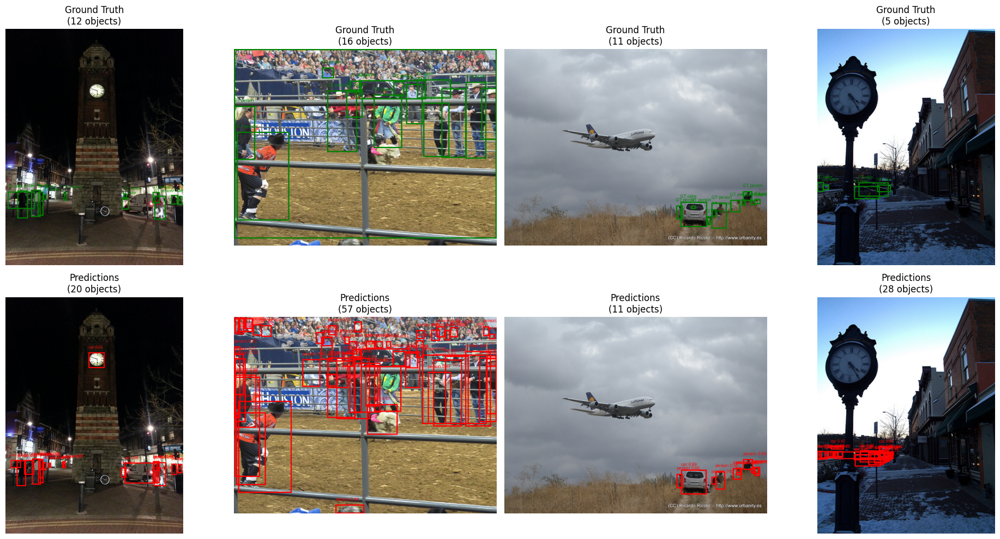

In [16]:
"""## Evaluation Results Display"""

# Display detailed results
print("\n" + "="*70)
print("COMPREHENSIVE EVALUATION RESULTS")
print("="*70)

print(f"\nDataset Statistics:")
print(f"  Total images evaluated: {eval_stats['total_images']}")
print(f"  Total ground truth objects: {eval_stats['total_gt_objects']}")
print(f"  Total predictions (conf > 0.3): {eval_stats['total_predictions']}")

print(f"\nDetailed Per-Class Performance:")
print("-" * 85)
print(f"{'Class':<12} {'Precision':<12} {'Recall':<12} {'F1-Score':<12} {'TP':<6} {'FP':<6} {'FN':<6}")
print("-" * 85)

total_tp = total_fp = total_fn = 0
for class_name, class_metrics in metrics.items():
    print(f"{class_name:<12} {class_metrics['precision']:<12.3f} {class_metrics['recall']:<12.3f} "
          f"{class_metrics['f1']:<12.3f} {class_metrics['tp']:<6} {class_metrics['fp']:<6} {class_metrics['fn']:<6}")
    total_tp += class_metrics['tp']
    total_fp += class_metrics['fp']
    total_fn += class_metrics['fn']

print("-" * 85)

# Calculate overall metrics
overall_precision = total_tp / (total_tp + total_fp) if (total_tp + total_fp) > 0 else 0
overall_recall = total_tp / (total_tp + total_fn) if (total_tp + total_fn) > 0 else 0
overall_f1 = 2 * overall_precision * overall_recall / (overall_precision + overall_recall) if (overall_precision + overall_recall) > 0 else 0

print(f"{'Overall':<12} {overall_precision:<12.3f} {overall_recall:<12.3f} {overall_f1:<12.3f} {total_tp:<6} {total_fp:<6} {total_fn:<6}")

# Performance analysis
avg_f1 = np.mean([m['f1'] for m in metrics.values()])
best_class = max(metrics, key=lambda x: metrics[x]['f1'])
worst_class = min(metrics, key=lambda x: metrics[x]['f1'])

print(f"\nPerformance Summary:")
print(f"  Average F1-Score: {avg_f1:.3f}")
print(f"  Best performing class: {best_class} (F1: {metrics[best_class]['f1']:.3f})")
print(f"  Most challenging class: {worst_class} (F1: {metrics[worst_class]['f1']:.3f})")

if avg_f1 > 0.6:
    performance_level = "Excellent"
elif avg_f1 > 0.4:
    performance_level = "Good"
elif avg_f1 > 0.2:
    performance_level = "Fair"
else:
    performance_level = "Needs Improvement"

print(f"  Overall Performance Level: {performance_level}")

# Show prediction examples
print(f"\nSample Predictions:")
evaluator.visualize_predictions(val_dataset, 4, confidence_threshold=0.3)